# Dataset Exploration – Distracted Driver Detection

## Objective
To understand the dataset structure, class distribution, and visual characteristics of driver behavior images before model training.


In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter


In [2]:
DATASET_PATH = "/kaggle/input/state-farm-distracted-driver-detection/imgs/train"


In [3]:
os.listdir(DATASET_PATH)

['c5', 'c7', 'c8', 'c2', 'c6', 'c4', 'c3', 'c1', 'c9', 'c0']

In [4]:
classes = sorted(os.listdir(DATASET_PATH))
classes

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

In [5]:
image_counts = {}

for cls in classes:
    cls_path = os.path.join(DATASET_PATH, cls)
    image_counts[cls] = len(os.listdir(cls_path))

image_counts


{'c0': 2489,
 'c1': 2267,
 'c2': 2317,
 'c3': 2346,
 'c4': 2326,
 'c5': 2312,
 'c6': 2325,
 'c7': 2002,
 'c8': 1911,
 'c9': 2129}

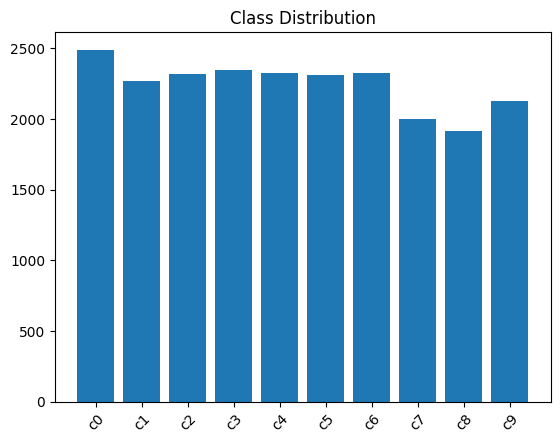

In [6]:
plt.bar(image_counts.keys(), image_counts.values())
plt.title("Class Distribution")
plt.xticks(rotation=45)
plt.show()


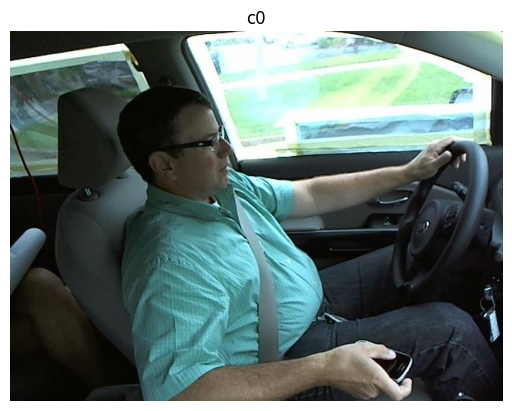

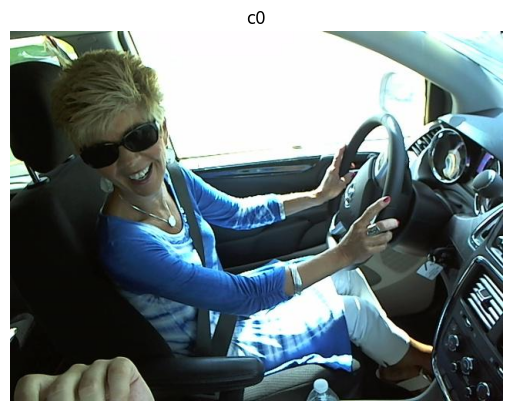

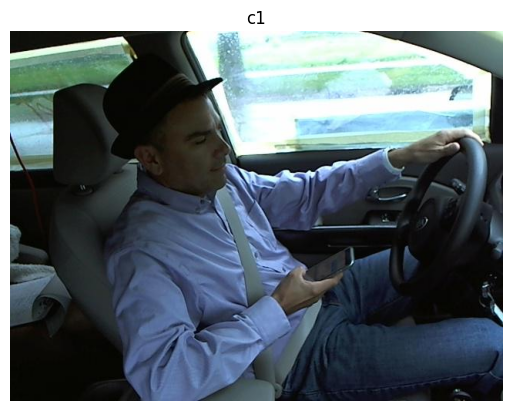

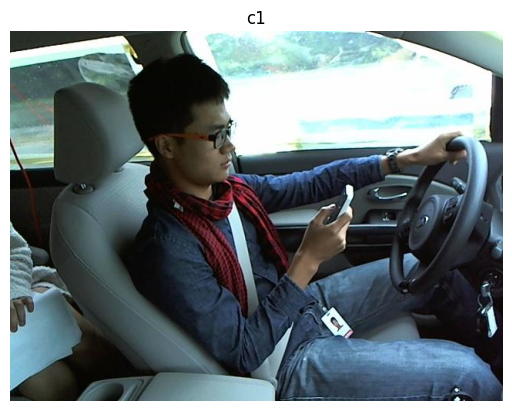

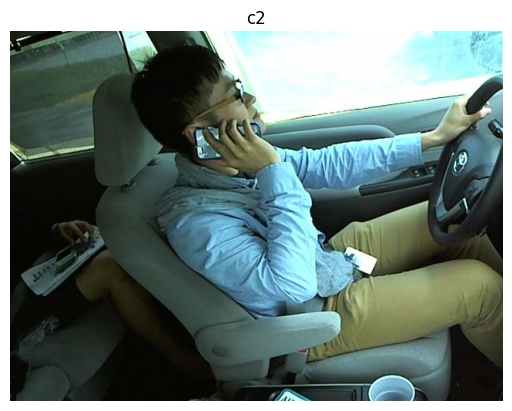

...

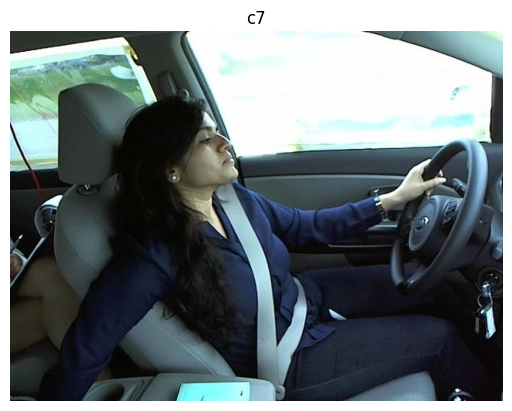

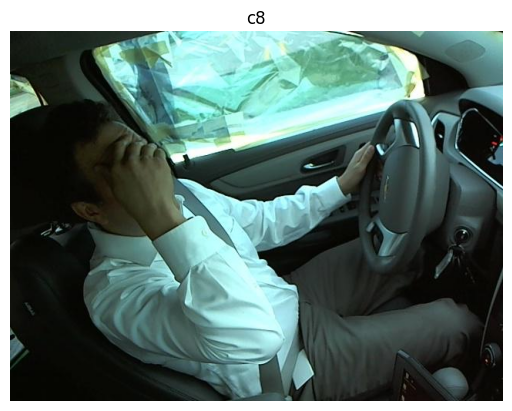

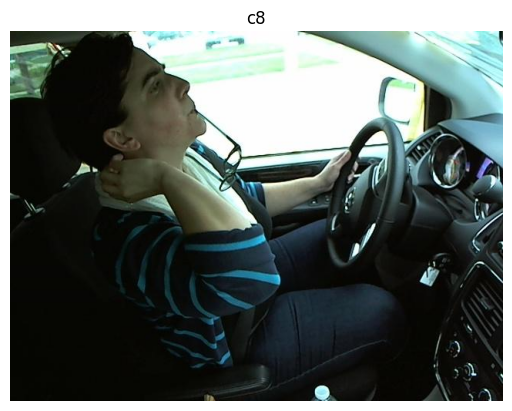

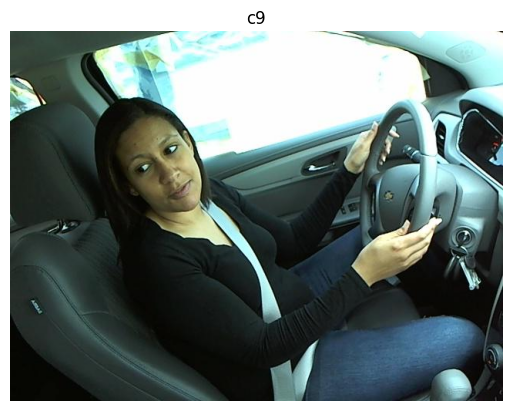

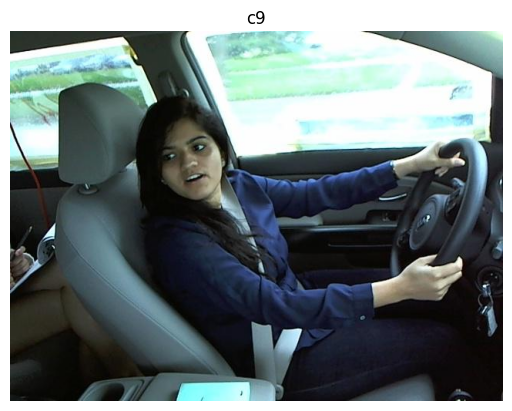

In [7]:
for cls in classes:
    cls_path = os.path.join(DATASET_PATH, cls)
    sample_images = os.listdir(cls_path)[:2]

    for img_name in sample_images:
        img_path = os.path.join(cls_path, img_name)
        img = Image.open(img_path)

        plt.imshow(img)
        plt.title(cls)
        plt.axis("off")
        plt.show()


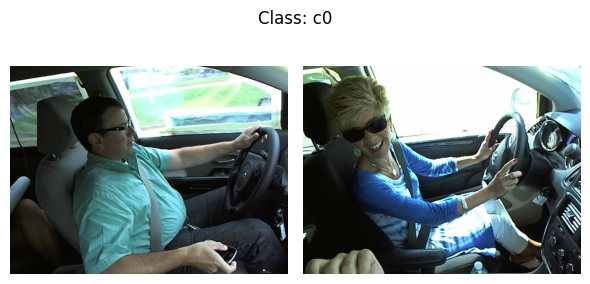

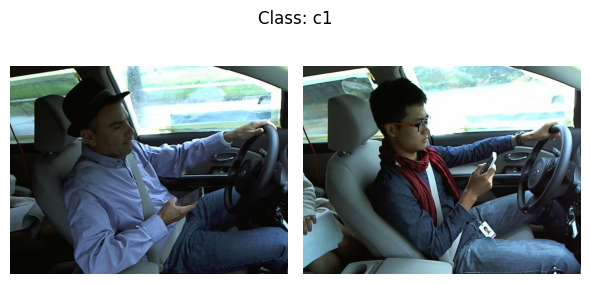

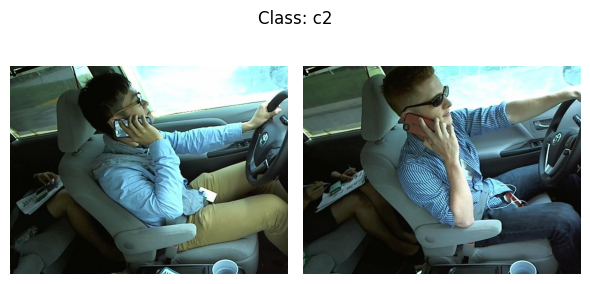

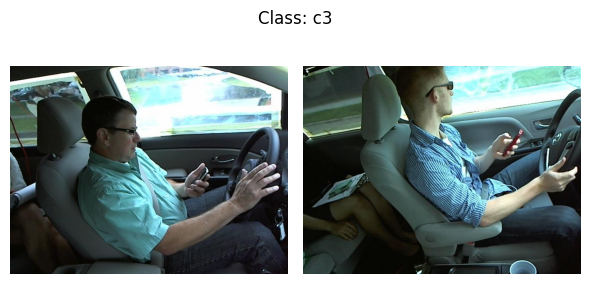

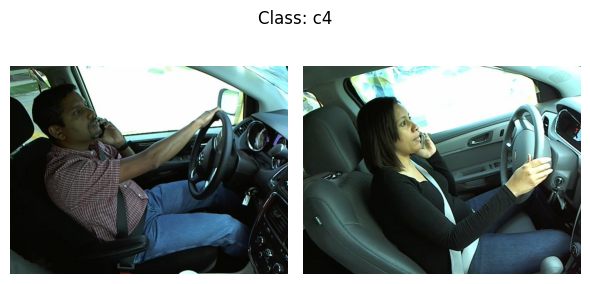

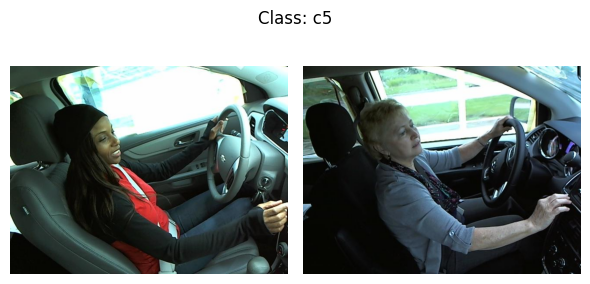

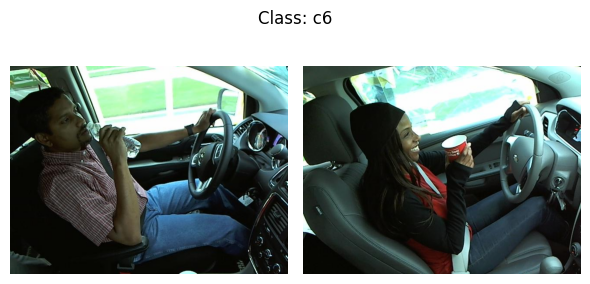

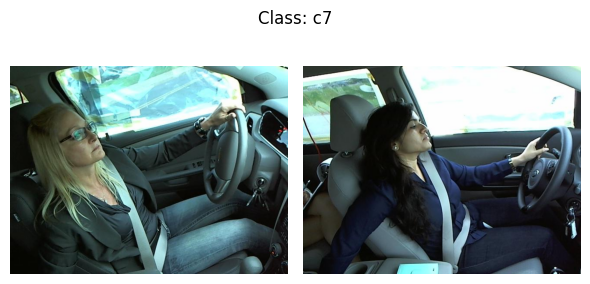

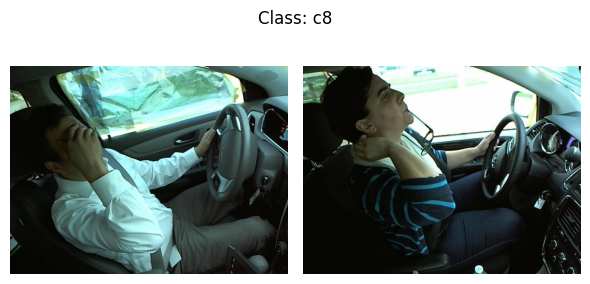

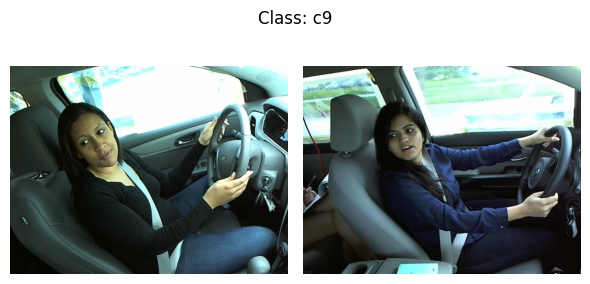

In [8]:
import os
import matplotlib.pyplot as plt
from PIL import Image

classes = sorted(os.listdir(DATASET_PATH))

for cls in classes:
    cls_path = os.path.join(DATASET_PATH, cls)
    image_names = os.listdir(cls_path)[:2]  

    fig, axes = plt.subplots(1, 2, figsize=(6, 3))
    fig.suptitle(f"Class: {cls}", fontsize=12)

    for i, img_name in enumerate(image_names):
        img_path = os.path.join(cls_path, img_name)
        img = Image.open(img_path)

        axes[i].imshow(img)
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()


## Observations

### Visual Characteristics
- Images are captured from a **fixed in-car camera** positioned near the front passenger side.
- The **driver’s upper body, hands, and steering wheel** are clearly visible in most samples.
- Background (car interior) remains largely consistent across images, while **driver appearance varies**.
- Lighting conditions vary significantly due to outdoor illumination, resulting in **brightness differences and glare** in some images.
- Drivers differ in posture, clothing, accessories (glasses, scarves), and body orientation.

### Class-wise Visual Patterns
- Some classes show **clear visual cues**, such as a phone held near the ear or in front of the driver.
- Certain distraction classes appear **visually similar**, especially those involving phone usage, where hand position and head orientation are the primary distinguishing features.
- Small objects (e.g., mobile phones) occupy a **relatively small region** of the image, making fine-grained feature learning important.
- In several samples, the driver’s face is partially turned away, indicating that **context (hands, arms, posture)** is as important as facial features.

### Class Distribution
- The dataset contains **multiple classes with roughly similar numbers of images**, indicating that it is **not severely imbalanced**.
- Some classes have **slightly fewer samples** compared to others, but no class appears extremely underrepresented.
- The relatively balanced distribution suggests that **overall accuracy is a meaningful metric**, though class-wise performance should still be monitored.

### Dataset Challenges
- Visual similarity between certain distraction classes may lead to **misclassification**, especially for phone-related activities.
- Variations in lighting and driver posture introduce **intra-class variability**.
- Since critical cues are subtle (hand position, object presence), the model must learn **fine spatial details** rather than relying on coarse features alone.

### Implications for Modeling
- A convolutional neural network (CNN) is suitable due to its ability to learn spatial hierarchies from images.
- Data augmentation may be beneficial to improve robustness to lighting and posture variations.
- Careful evaluation using class-wise metrics will be important to understand confusion between visually similar classes.
